# Leaf Disease Classification

All done using AI coding, defualt version in Google Colab, Gemini flash 2.5

Data source:https://www.kaggle.com/datasets/khanaamer/wheat-leaf-disease-dataset

In [ ]:
!pip install -q kagglehub

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("khanaamer/wheat-leaf-disease-dataset")

print("Path to dataset files:", path)

100%|██████████| 1.47G/1.47G [00:23<00:00, 67.0MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/khanaamer/wheat-leaf-disease-dataset/versions/1


In [ ]:
type(path)

str

In [ ]:
import pandas as pd
import os

# The 'path' variable is a string representing the root directory of the dataset.
# We cannot index a string with another string (e.g., path['train']).
# Instead, we need to construct the full file path to the training data.

# Based on previous exploration, the 'Train' directory contains subfolders (classes).
# We need to collect all image file paths from these subfolders.

wheat_leaf_disease_path = os.path.join(path, 'Wheat Leaf Disease')
train_folder_path = os.path.join(wheat_leaf_disease_path, 'Train')

image_filepaths = []
labels = []

# Define common image extensions to look for
image_extensions = ('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff')

# Walk through the 'Train' directory to find all image files
for root, _, files in os.walk(train_folder_path):
    for file in files:
        if file.lower().endswith(image_extensions):
            image_filepaths.append(os.path.join(root, file))
            # The label is the name of the immediate parent directory
            labels.append(os.path.basename(root))

# Create a DataFrame from the collected file paths and labels
df_train = pd.DataFrame({"filepath": image_filepaths, "label": labels})

# Display the top 5 rows of the DataFrame
print(df_train.head(5))

                                            filepath            label
0  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
1  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
2  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
3  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
4  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot


In [ ]:
# prompt: convert ds to pandas dataframe name it leaf_pd
# The 'path' variable is a string, and cannot be indexed with 'train'.
# Based on previous steps, the training data (image file paths and labels)
# has been correctly collected into a pandas DataFrame called 'df_train'.
# We will assign this 'df_train' to 'leaf_pd' as requested.
leaf_pd = df_train

# Display the head of the newly created DataFrame
print(leaf_pd.head(5))

                                            filepath            label
0  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
1  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
2  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
3  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot
4  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot


In [ ]:
# prompt: convert ds to pandas dataframe name it leaf_pd
# This line is incorrect as 'path' is a string and cannot be indexed with 'train'.
# leaf_pd has already been created in previous steps from the file system walk.
# leaf_pd = path['train'].to_pandas()

In [ ]:
leaf_pd = df_train

In [ ]:
leaf_pd.head(3)

,filepath,label
0,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot
1,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot
2,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot


Displaying the first 5 images from 'leaf_pd':


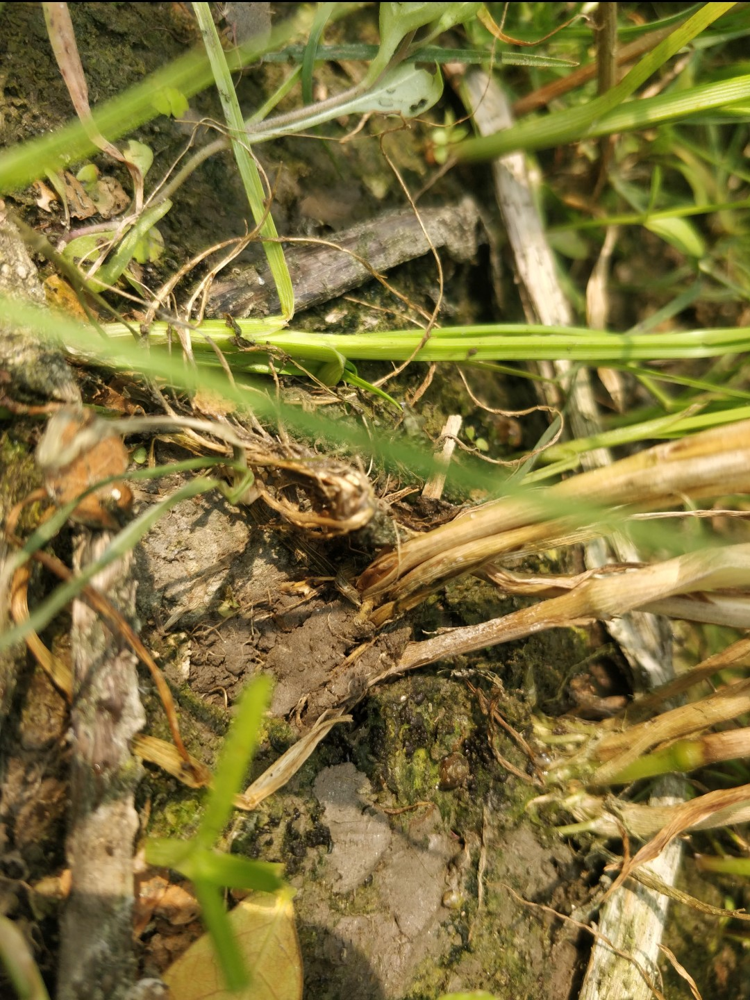

Label: FusariumFootRot


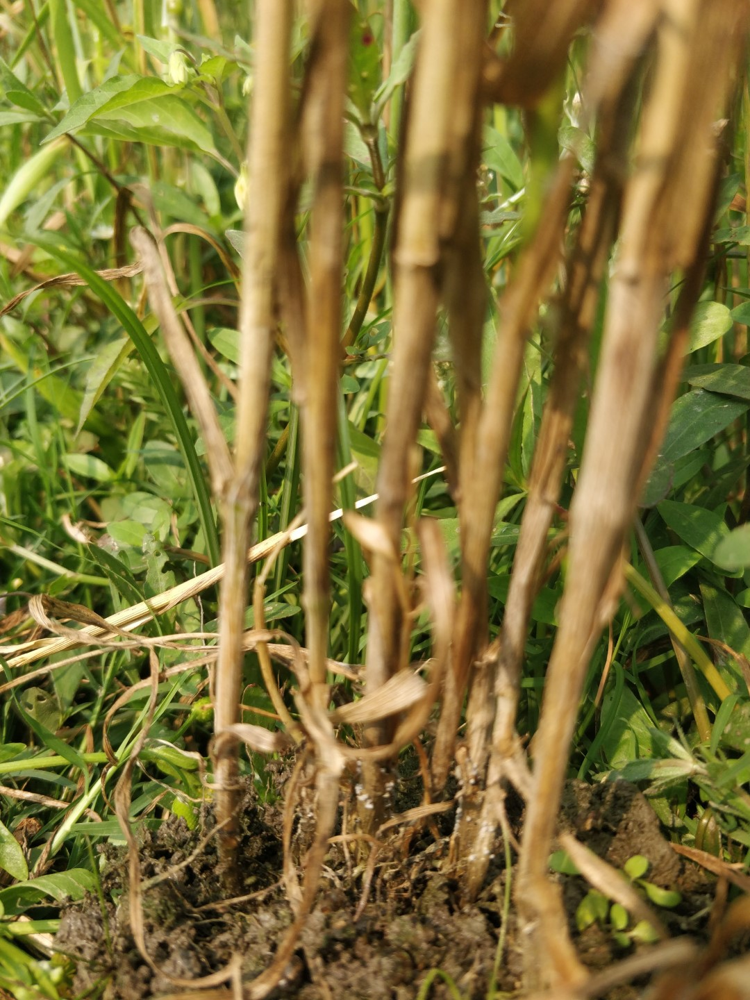

Label: FusariumFootRot


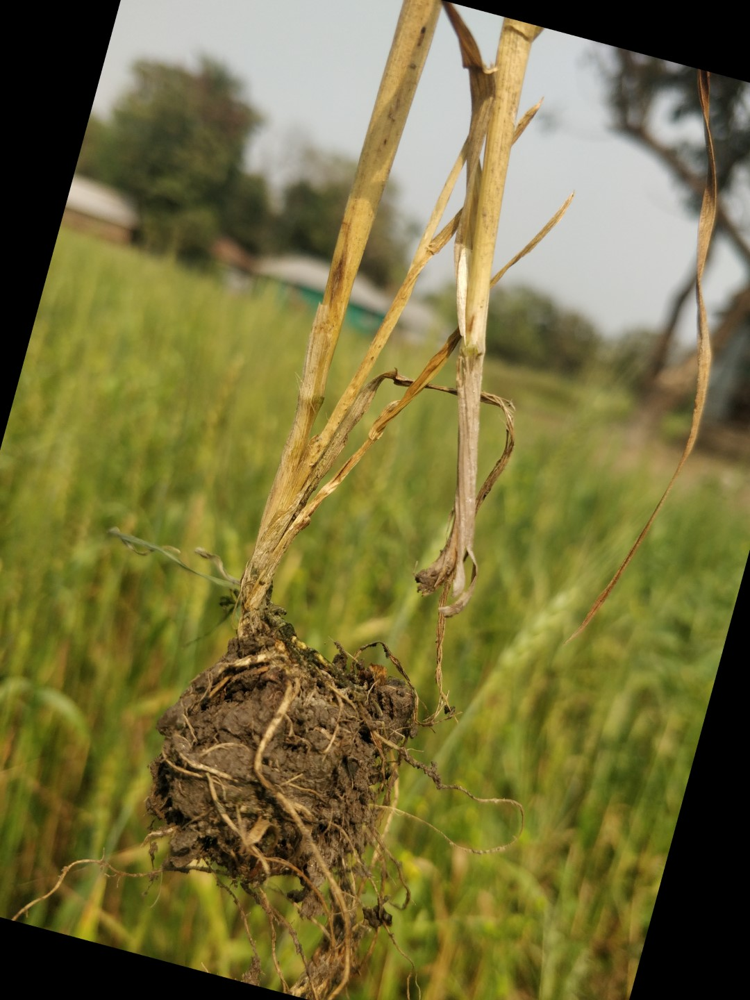

Label: FusariumFootRot


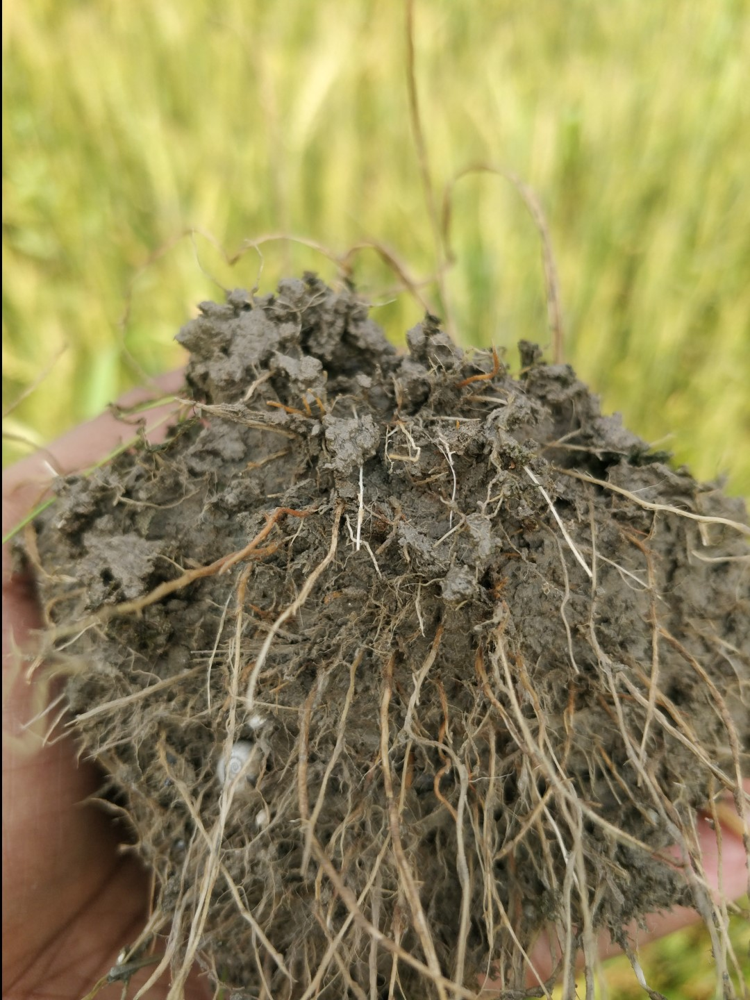

Label: FusariumFootRot


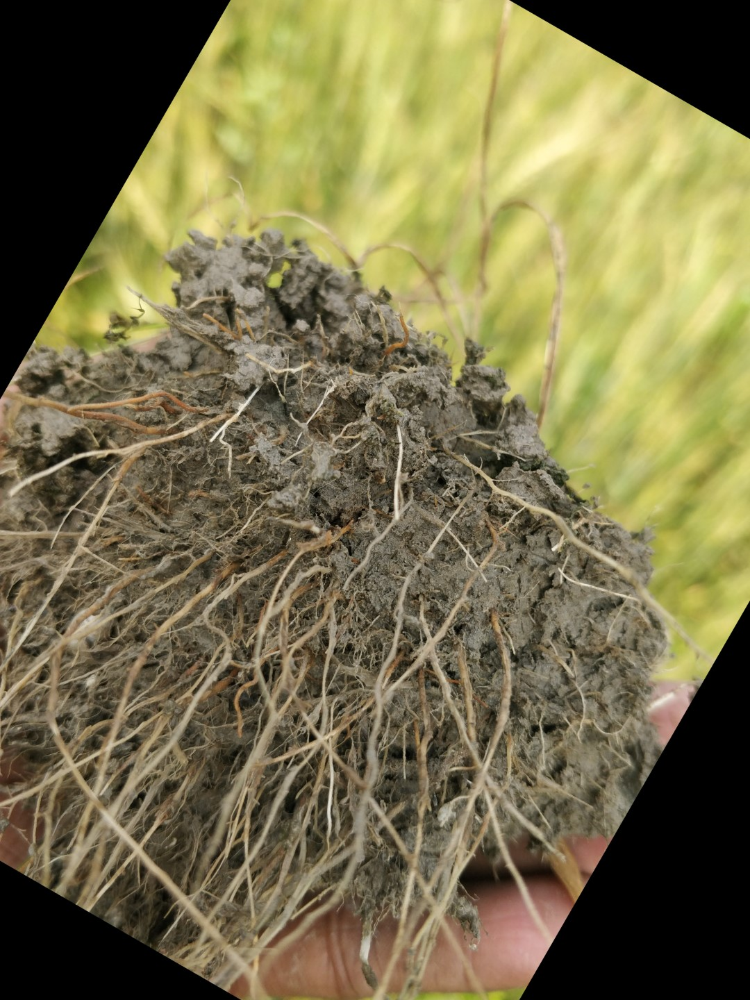

Label: FusariumFootRot


In [ ]:
from IPython.display import display
from PIL import Image
import os

# The 'leaf_pd' DataFrame contains the 'filepath' column with paths to the images.
# We need to iterate through these file paths, open each image, and then display it.

print("Displaying the first 5 images from 'leaf_pd':")
for i in range(min(5, len(leaf_pd))):
    image_path = leaf_pd.iloc[i]['filepath']
    try:
        img = Image.open(image_path)
        display(img)
        print(f"Label: {leaf_pd.iloc[i]['label']}")
    except FileNotFoundError:
        print(f"Error: Image not found at {image_path}")
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")

In [ ]:
leaf_pd.tail(3)

,filepath,label
3452,/root/.cache/kagglehub/datasets/khanaamer/whea...,HealthyLeaf
3453,/root/.cache/kagglehub/datasets/khanaamer/whea...,HealthyLeaf
3454,/root/.cache/kagglehub/datasets/khanaamer/whea...,HealthyLeaf


In [ ]:
# The 'leaf_pd['label']' column already contains the disease names as strings.
# For example, it has values like 'LeafBlight', 'WheatBlast', etc.
# Therefore, no further conversion from numerical labels to disease names is needed
# in this dataset as the labels are already in string format.

# If you wish to have a separate column named 'disease_type' with these string labels,
# you can simply copy the 'label' column:
leaf_pd['disease_type'] = leaf_pd['label']

# Display the updated Dataframe with the new 'disease_type' column
print("Updated leaf_pd DataFrame with 'disease_type' column:")
print(leaf_pd.head())

Updated leaf_pd DataFrame with 'disease_type' column:
                                            filepath            label  \
0  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot   
1  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot   
2  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot   
3  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot   
4  /root/.cache/kagglehub/datasets/khanaamer/whea...  FusariumFootRot   

      disease_type  
0  FusariumFootRot  
1  FusariumFootRot  
2  FusariumFootRot  
3  FusariumFootRot  
4  FusariumFootRot  


In [ ]:
leaf_pd.tail(3)

,filepath,label,disease_type
3452,/root/.cache/kagglehub/datasets/khanaamer/whea...,HealthyLeaf,HealthyLeaf
3453,/root/.cache/kagglehub/datasets/khanaamer/whea...,HealthyLeaf,HealthyLeaf
3454,/root/.cache/kagglehub/datasets/khanaamer/whea...,HealthyLeaf,HealthyLeaf


In [ ]:
# prompt: show all unique disease_type
unique_disease_types = leaf_pd['disease_type'].unique()

print(unique_disease_types)

['FusariumFootRot' 'LeafBlight' 'BlackPoint' 'WheatBlast' 'HealthyLeaf']


In [ ]:
# prompt: drop the label column in leaf_pd
leaf_pd.drop(columns=['label'], inplace=True)
display(leaf_pd.head())

,filepath,disease_type
0,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot
1,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot
2,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot
3,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot
4,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot


In [ ]:
from PIL import Image

# WARNING: Storing all PIL Image objects directly in the DataFrame for a large dataset
# can consume a lot of memory and potentially lead to a kernel crash.
# It is generally more memory-efficient to load images on demand when needed from their filepaths.
leaf_pd['pil_image_data'] = leaf_pd['filepath'].apply(lambda x: Image.open(x))

In [ ]:
# Explicitly convert all images in 'pil_image_data' to RGB to ensure consistent channel numbers

leaf_pd['pil_image_data'] = leaf_pd['pil_image_data'].apply(lambda img: img.convert('RGB') if img.mode != 'RGB' else img)

In [ ]:
# Verify all images are now RGB

non_rgb_modes = leaf_pd['pil_image_data'].apply(lambda img: img.mode if img.mode != 'RGB' else None).dropna().unique()



if len(non_rgb_modes) > 0:

    print(f"Found non-RGB image modes after conversion: {non_rgb_modes}")

else:

    print("All images in 'pil_image_data' are successfully converted to RGB.")

All images in 'pil_image_data' are successfully converted to RGB.


In [ ]:
# prompt: Export the leaf_pd DataFrame to a CSV file
# index=False prevents pandas from wriring the DataFrame index as a column in the CSV
leaf_pd.to_csv('wheat_leaf_data.csv', index=False)
print ("DataFrame 'leaf_pd' exported to 'wheat_leaf_data.csv'")

DataFrame 'leaf_pd' exported to 'wheat_leaf_data.csv'


In [ ]:
# Load the previously exported CSV file back into pandas DataFrame
reloaded_leaf_pd = pd.read_csv('wheat_leaf_data.csv')

# Display the first few rows of the reloaded DataFrame to verify
display (reloaded_leaf_pd.head())

,filepath,disease_type,pil_image_data
0,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=...
1,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=...
2,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=...
3,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=...
4,/root/.cache/kagglehub/datasets/khanaamer/whea...,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=...


Now, lets import fastai vision functionalities, define necessary image transformations, and create ImageDataLoaders object.

In [ ]:
# prompt: convert the leaf_pd to a fastai data loader object
# prompt: (it has errors so I say) fix this error
from fastai.vision.all import *

# Define a custom transform to ensure all images are RGB
class ConvertImageToRGB(Transform):
  def encodes(self, x:PILImage):
    if x.mode != 'RGB':
      return x.convert('RGB')
    return x # Ensure RGB images are also returned
# Define item transformations (applied to individual images)
# First, ensure all images are RGB, then resize.
items_tfms = [ConvertImageToRGB(), Resize (224)]

# Define batch transformations (applied to batches of images)
# These include data augmentation and normalization.
# 'aug_transforms' provides common augmentation techniques
#'Normalize.from_stats(*imagenet-stats)' normalizes pixel value using ImageNet's mean and standard deviation,
# which is standard for transfer learning with models pre-trained on ImageNet.
batch_tfms = [*aug_transforms(size=224, min_scale=0.75), Normalize.from_stats(*imagenet_stats)]

In [ ]:
# # Extract actual PIL Image objects fdrom ds['train] and add them to leaf_pd
# # This is necessary because leaf_pd['image] currently holds dictionaries, not PIL Image object directly.
# leaf_pd['pil_image_data'] = [item['image'] for item in ds['train']]

In [ ]:
leaf_pd.head(3)

,filepath,disease_type,pil_image_data
0,/root/.cache/kagglehub/datasets/khanaamer/wheat-leaf-disease-dataset/versions/1/Wheat Leaf Disease/Train/FusariumFootRot/shifted_0_10_616.jpg,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1080x1440>
1,/root/.cache/kagglehub/datasets/khanaamer/wheat-leaf-disease-dataset/versions/1/Wheat Leaf Disease/Train/FusariumFootRot/flipped_horizontal_481.jpg,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1080x1440>
2,/root/.cache/kagglehub/datasets/khanaamer/wheat-leaf-disease-dataset/versions/1/Wheat Leaf Disease/Train/FusariumFootRot/rotated_-15_646.jpg,FusariumFootRot,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1080x1440>


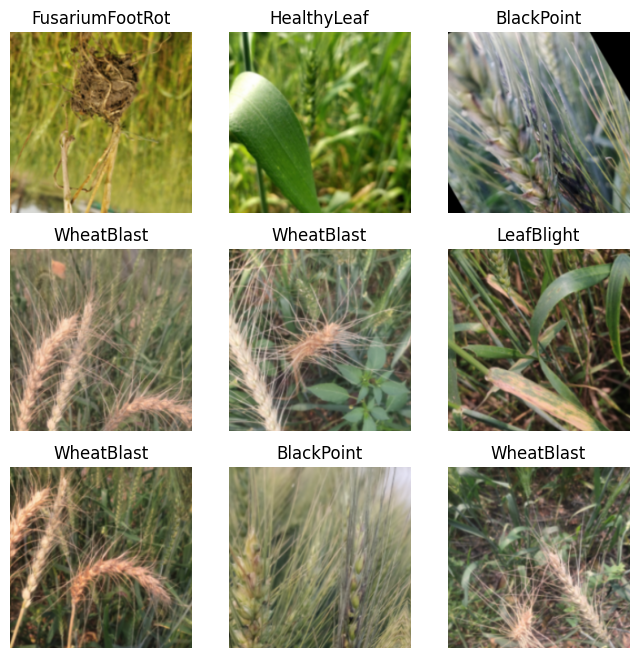

In [ ]:
# prompt: convert the leaf_pod to a fastai data loader object
# promp: (it has errors so I say) fix this error (3 times, until no more error)
from fastai.vision.all import *

# Define the DataBlock for image classification
wheat_leaf_block = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_x=ColReader('filepath'), # Changed: Get image from 'filepath' column, let ImageBlock open it
    get_y=ColReader('disease_type'),   # label from 'disease_type' column
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    item_tfms = items_tfms, # Corrected: Use the defined items_tfms which now includes ConvertImageToRGB
    batch_tfms=batch_tfms
)

# Create the DataLoaders object from the leaf_pd DataFrame using the DataBlock.
dls = wheat_leaf_block.dataloaders(leaf_pd, bs=64, num_workers=0)

# Display a batch of images to verify the DataLoader is set up correctly.
dls.show_batch(max_n=9, figsize=(8, 8))

In [ ]:
# prompt: create fastai learner object from dls
# Create a fastai Lewarner object
# We will use a pre-trained ResNet34 model, which is common for image classifcation tasks.
# The metrics parameter will track accuracy during training.
learn = cnn_learner(dls, resnet34, metrics=accuracy)

# Display the Learner object to see its structure and parameters
print(learn)

/usr/local/lib/python3.12/dist-packages/fastai/vision/learner.py:303: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 171MB/s]


<div></div>

SuggestedLRs(valley=0.0008317637839354575)
Suggested learning rate: 0.0008317637839354575


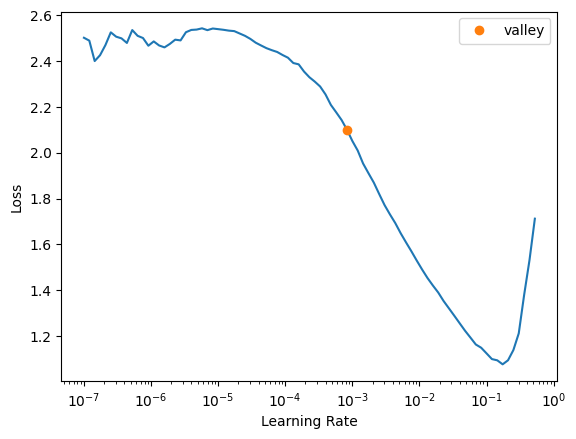

In [ ]:
# Find learning rate
lr_suggestion = learn.lr_find()

print(lr_suggestion)

# Use the valley suggestion
lr = lr_suggestion.valley

print(f"Suggested learning rate: {lr}")

<div></div>

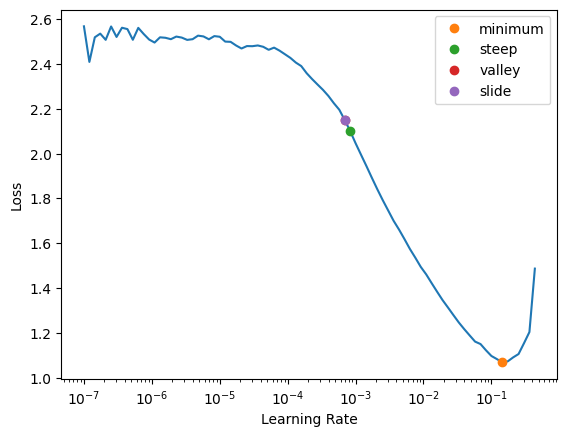

In [ ]:
lrates = learn.lr_find(suggest_funcs =(minimum, steep, valley, slide))

In [ ]:
lrates.slide

0.0006918309954926372

In [ ]:
learn.fine_tune(8, base_lr=lrates.slide)

epoch,train_loss,valid_loss,accuracy,time
0,1.078870,0.150350,0.953690,18:29


epoch,train_loss,valid_loss,accuracy,time
0,0.195768,0.060780,0.981187,26:40
1,0.116312,0.008378,0.997106,26:52
2,0.061143,0.005418,0.998553,26:44
3,0.036467,0.001574,1.000000,26:22
4,0.021972,0.001842,1.000000,26:35
5,0.012751,0.001102,1.000000,26:29
6,0.007773,0.001193,1.000000,26:23
7,0.010023,0.000957,1.000000,26:15


# Export and save leaner

In [ ]:
# prompt: export and save foxy.learner

fname = f"./leaf_disease_learner_{int(time.time())}.pkl"
learn.export(fname)
print(fname)

./leaf_disease_learner_1783697002.pkl


# Optional: Callback

In [ ]:
# prompt: print current unix timestamp

print(int(time.time()))

1783697002


In [ ]:
# Custom callback definition
class Foxy_cb(Callback):
  def before_fit(self):
    print("Foxy: Starting training...")
  #
  def after_fit(self):
    print("Foxy: Training complete!")
  #
  def after_epoch(self):
    print(f"Foxy: Time: {int(time.time())}")
    # Access the error_rate metric
    # error_rate_value = self.learn.recorder.metrics[-1][self.learn.recorder.metric_names.index('error_rate')]
    error_rate_name = self.learn.recorder.metrics[-1].name
    error_rate_value = self.learn.recorder.metrics[-1].value.item()
    print(f"Foxy: Error rate after epoch {self.learn.epoch}: Name: {error_rate_name}: Value: {error_rate_value}")
    print(f"Foxy: type learn: {type(self.learn)}")
    # check for exit
    if (error_rate_value <= 0.065):
      print("Foxy: Exiting training early...")
      # self.learn.cancel_training()
      # self.learn.cancel_train = True
    return

In [ ]:
# prompt: add in a call back function to the foxy.learner.fine_tune() method

learn.fine_tune(3, cbs=Foxy_cb())

Foxy: Starting training...


epoch,train_loss,valid_loss,accuracy,time
0,0.004796,0.000837,1.000000,18:49


Foxy: Time: 1783698132
Foxy: Error rate after epoch 0: Name: accuracy: Value: 1.0
Foxy: type learn: <class 'fastai.learner.Learner'>
Foxy: Training complete!
Foxy: Starting training...


epoch,train_loss,valid_loss,accuracy,time
0,0.005029,0.023194,0.995658,26:33
1,0.020346,0.009308,0.997106,26:29
2,0.017911,0.008905,0.997106,26:23


Foxy: Time: 1783699726
Foxy: Error rate after epoch 0: Name: accuracy: Value: 0.9956584572792053
Foxy: type learn: <class 'fastai.learner.Learner'>
Foxy: Time: 1783701316
Foxy: Error rate after epoch 1: Name: accuracy: Value: 0.9971056580543518
Foxy: type learn: <class 'fastai.learner.Learner'>
Foxy: Time: 1783702900
Foxy: Error rate after epoch 2: Name: accuracy: Value: 0.9971056580543518
Foxy: type learn: <class 'fastai.learner.Learner'>
Foxy: Training complete!


In [ ]:
# prompt: how to create p1 as a TensorBase value 0.9

p1 = TensorBase(0.9)

In [ ]:
type(p1)

fastai.torch_core.TensorBase

In [ ]:
# prompt: convert p1 to float

p2 = p1.item()
print(p2, type(p2))

0.8999999761581421 <class 'float'>


In [ ]:
import fastai
from fastai.vision.all import *
help(fastai.learner.AvgMetric)

Help on class AvgMetric in module fastai.learner:

class AvgMetric(Metric)
 |  AvgMetric(func)
 |
 |  Average the values of `func` taking into account potential different batch sizes
 |
 |  Method resolution order:
 |      AvgMetric
 |      Metric
 |      builtins.object
 |
 |  Methods defined here:
 |
 |  __init__(self, func)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |
 |  accumulate(self, learn)
 |      Use `learn` to update the state with new results
 |
 |  reset(self)
 |      Reset inner state to prepare for new computation
 |
 |  ----------------------------------------------------------------------
 |  Readonly properties defined here:
 |
 |  name
 |      Name of the `Metric`, camel-cased and with Metric removed
 |
 |  value
 |      The value of the metric
 |
 |  ----------------------------------------------------------------------
 |  Data and other attributes defined here:
 |
 |  __slotnames__ = []
 |
 |  ------------------------------------------

In [ ]:
import fastai
help(fastai.learner.Learner)

Help on class Learner in module fastai.learner:

class Learner(fastcore.basics.GetAttr)
 |  Learner(dls: 'DataLoaders', model: 'Callable', loss_func: 'Callable | None' = None, opt_func: 'Optimizer | OptimWrapper' = <function Adam at 0x7f884ef8f560>, lr: 'float | slice' = 0.001, splitter: 'Callable' = <function trainable_params at 0x7f881623c0e0>, cbs: 'Callback | MutableSequence | None' = None, metrics: 'Callable | MutableSequence | None' = None, path: 'str | Path | None' = None, model_dir: 'str | Path' = 'models', wd: 'float | int | None' = None, wd_bn_bias: 'bool' = False, train_bn: 'bool' = True, moms: 'tuple' = (0.95, 0.85, 0.95), default_cbs: 'bool' = True)
 |
 |  Group together a `model`, some `dls` and a `loss_func` to handle training
 |
 |  Method resolution order:
 |      Learner
 |      fastcore.basics.GetAttr
 |      builtins.object
 |
 |  Methods defined here:
 |
 |  __call__(self, event_name)
 |      Call `event_name` for all `Callback`s in `self.cbs`
 |
 |  __enter__(self

# Smoke test learner (CNN)

In [ ]:
# hand code (not using GenAI)

learn.summary()

<div></div>

Sequential (Input shape: 64 x 3 x 224 x 224)
Layer (type)         Output Shape         Param #    Trainable 
                     64 x 64 x 112 x 112 
Conv2d                                    9408       True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     64 x 64 x 56 x 56   
MaxPool2d                                                      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                                                           
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
ReLU                      

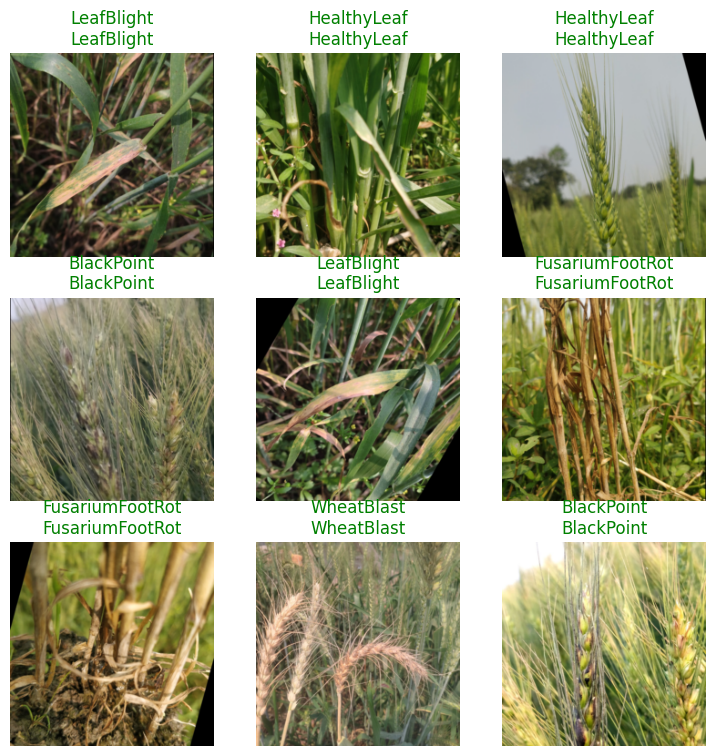

In [ ]:
# hand code (not using GenAI)

learn.show_results()

In [ ]:
 # learner.recorder.plot_loss(skip_start=1, with_valid=True, suggestion=True)

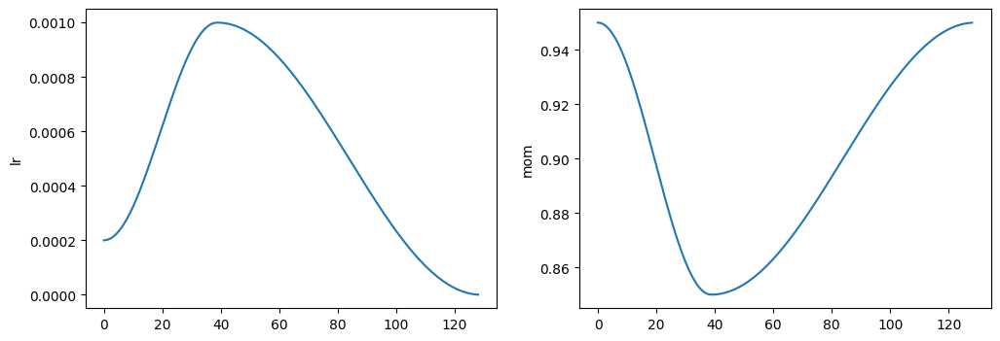

In [ ]:
# hand code (not using GenAI)

learn.recorder.plot_sched()

In [ ]:
learn.show_training_loop()

Start Fit
   - before_fit     : [TrainEvalCallback, Recorder, ProgressCallback]
  Start Epoch Loop
     - before_epoch   : [Recorder, ProgressCallback]
    Start Train
       - before_train   : [TrainEvalCallback, Recorder, ProgressCallback]
      Start Batch Loop
         - before_batch   : [CastToTensor]
         - after_pred     : []
         - after_loss     : []
         - before_backward: []
         - before_step    : []
         - after_step     : []
         - after_cancel_batch: []
         - after_batch    : [TrainEvalCallback, Recorder, ProgressCallback]
      End Batch Loop
    End Train
     - after_cancel_train: [Recorder]
     - after_train    : [Recorder, ProgressCallback]
    Start Valid
       - before_validate: [TrainEvalCallback, Recorder, ProgressCallback]
      Start Batch Loop
         - **CBs same as train batch**: []
      End Batch Loop
    End Valid
     - after_cancel_validate: [Recorder]
     - after_validate : [Recorder, ProgressCallback]
  End Epoch Loop

In [ ]:
# hand code (not using GenAI)

smoke_learner = fastai.interpret.Interpretation.from_learner(learn)

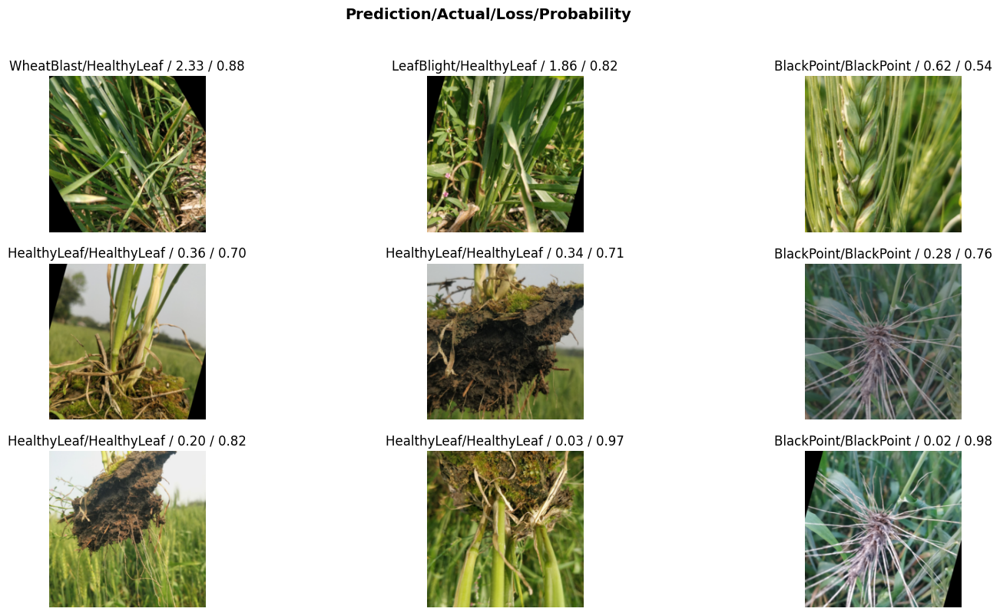

In [ ]:
# hand code (not using GenAI)

smoke_learner.plot_top_losses(9, figsize=(18,9))

In [ ]:
# hand code (not using GenAI)

smoke_learner.top_losses(21)

(TensorBase([2.3314, 1.8569, 0.6245, 0.3566, 0.3446, 0.2794, 0.1952, 0.0258,
             0.0241, 0.0186, 0.0098, 0.0096, 0.0079, 0.0074, 0.0072, 0.0064,
             0.0063, 0.0054, 0.0049, 0.0029, 0.0028]),
 TensorBase([241, 163,   5, 682, 615, 338, 674, 214,  33, 143, 444, 401, 597,
             500, 490, 395, 598, 611, 491, 157, 366]))

In [ ]:
# hand code (not using GenAI)

from fastai.interpret import ClassificationInterpretation
smoke_learner = ClassificationInterpretation.from_learner(learn)
# smoke_learner = fastai.interpret.Interpretation.from_learner(foxy.learner)

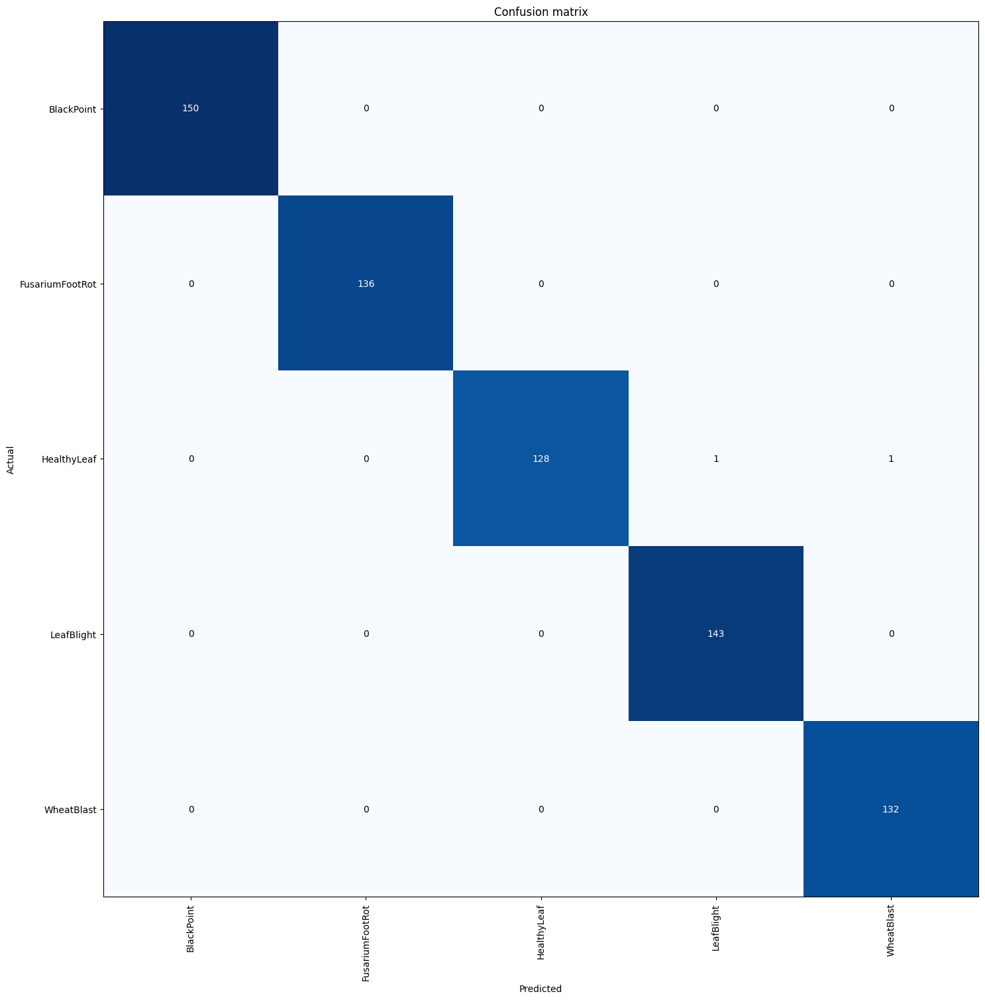

In [ ]:
# hand code (not using GenAI)

smoke_learner.plot_confusion_matrix(figsize=(15,15))

In [ ]:
# hand code (not using GenAI)

smoke_learner.print_classification_report()

                 precision    recall  f1-score   support

     BlackPoint       1.00      1.00      1.00       150
FusariumFootRot       1.00      1.00      1.00       136
    HealthyLeaf       1.00      0.98      0.99       130
     LeafBlight       0.99      1.00      1.00       143
     WheatBlast       0.99      1.00      1.00       132

       accuracy                           1.00       691
      macro avg       1.00      1.00      1.00       691
   weighted avg       1.00      1.00      1.00       691



# Load CNN

load the saved leaner in pickle (*.pkl) format

In [ ]:
# # smoke test it
# !ls -la foxy_cnn_image_classification

In [ ]:
# !ls -la foxy_cnn_image_classification/deploy
!ls -la

total 86340
drwxr-xr-x 1 root root     4096 Jul 10 15:23 .
drwxr-xr-x 1 root root     4096 Jul 10 08:57 ..
drwxr-xr-x 4 root root     4096 Jun  4 13:32 .config
-rw-r--r-- 1 root root 87565999 Jul 10 15:23 leaf_disease_learner_1783697002.pkl
drwxr-xr-x 2 root root     4096 Jul 10 11:32 models
drwxr-xr-x 1 root root     4096 Jun  4 13:32 sample_data
-rw-r--r-- 1 root root   821511 Jul 10 10:22 wheat_leaf_data.csv


In [ ]:
wheat_leaf_engine = "./leaf_disease_learner_1782936776.pkl"

In [ ]:
# if jump directly here then we need to install fastai

!pip install fastai
import fastai

In [ ]:
# prompt: check fastai version

import fastai
print(fastai.__version__)

2.8.7


In [ ]:
!ls -la

total 86340
drwxr-xr-x 1 root root     4096 Jul 10 15:23 .
drwxr-xr-x 1 root root     4096 Jul 10 08:57 ..
drwxr-xr-x 4 root root     4096 Jun  4 13:32 .config
-rw-r--r-- 1 root root 87565999 Jul 10 15:23 leaf_disease_learner_1783697002.pkl
drwxr-xr-x 2 root root     4096 Jul 10 11:32 models
drwxr-xr-x 1 root root     4096 Jun  4 13:32 sample_data
-rw-r--r-- 1 root root   821511 Jul 10 10:22 wheat_leaf_data.csv


In [ ]:
!pwd

/content


Copyright (c) 2026 Victor Jimmy All rights reserved.

This work, including all code, models, data, and documentation, is the exclusive property of the copyright holder. No part of this work may be copied, reproduced, modified, distributed, or used in any form without explicit written permission from the copyright holder.